In [1]:
import os
from fish_results import *
from analysis_scripts.iterative_classify_codestacks import *
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
poses = [i for i in os.listdir(cstk_path) if os.path.isdir(os.path.join(cstk_path, i))]
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
spotcalls = spotcat(hybedatas,cstk_path)

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os

ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(spotcalls[spotcalls.ave>1000].gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()

NameError: name 'spotcalls' is not defined

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os

ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(spotcalls[spotcalls.ave>1000].gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()

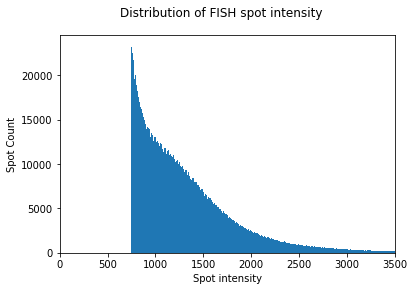

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
temp_df = spotcalls[spotcalls.ave>750]
plt.hist(temp_df.ave,bins=int(len(temp_df.ave)/1000))
plt.xlim([0,3500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')
plt.show()

3188225


In [53]:
import pickle
beads = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/beads.pkl','rb'))
for pos in beads.keys():
    print(pos)
    beads[pos].pop('hybe5',None)
    if pos in poses:
        beads[pos].pop('hybe4',None)
pickle.dump(beads,open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/beads.pkl','wb'))

Pos1
Pos7
Pos8
Pos9
Pos10
Pos11
Pos20
Pos19
Pos18
Pos17
Pos16
Pos27
Pos26
Pos25
Pos15
Pos14
Pos24
Pos23
Pos36
Pos37
Pos38
Pos39
Pos40
Pos41
Pos28
Pos29
Pos30
Pos31
Pos21
Pos32
Pos45
Pos44
Pos43
Pos42
Pos55
Pos54
Pos53
Pos52
Pos51
Pos50
Pos49
Pos63
Pos64
Pos65
Pos66
Pos67
Pos68
Pos69
Pos70
Pos56
Pos57
Pos58
Pos71
Pos72
Pos73
Pos74
Pos88
Pos113
Pos112
Pos100
Pos101
Pos87
Pos86
Pos85
Pos99
Pos111
Pos123
Pos135
Pos134
Pos122
Pos110
Pos98
Pos84
Pos83
Pos82
Pos81
Pos80
Pos79
Pos78
Pos77
Pos91
Pos92
Pos93
Pos94
Pos95
Pos96
Pos97
Pos109
Pos108
Pos107
Pos106
Pos105
Pos104
Pos116
Pos117
Pos118
Pos119
Pos120
Pos121
Pos133
Pos132
Pos131
Pos130
Pos129
Pos128
Pos139
Pos140
Pos141
Pos142
Pos143
Pos144
Pos145
Pos146
Pos154
Pos153
Pos152
Pos151
Pos150
Pos149
Pos157
Pos158
Pos159
Pos160
Pos161
Pos162
Pos172
Pos171
Pos170
Pos169
Pos168
Pos167
Pos166
Pos165
Pos175
Pos176
Pos177
Pos178
Pos179
Pos180
Pos181
Pos182
Pos183
Pos184
Pos193
Pos192
Pos191
Pos190
Pos189
Pos188
Pos187
Pos186
Pos200
Pos199
Pos198
Pos

In [42]:
pickle.dump(beads,open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/beads.pkl','wb'))

In [8]:
from metadata import Metadata
md = Metadata('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/hybe3_3/')
105
104
116
117
118
119
120
121
133
132

In [52]:
processing = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/Pos312/processing.pkl','rb'))
processing

{0, 10}

In [51]:
processing

{1, 5, 6, 8}

In [15]:
md.image_table

,FlatField,df_pos,linescan,Position,group,acq,frame,TimestampImage,XY,PixelSize,...,Z,Zindex,XYbeforeTransform,Exposure,Channel,Triggered,Skip,TimestampFrame,filename,root_pth
0,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308202,"[-102.0, 4618.0]",0.1032,...,3011.819,1,"[-101.5999999999999, 4618.419]",475,FarRed,False,1,737446.308209,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000001_000000000_FarRed_000_0...
1,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308211,"[-102.0, 4618.0]",0.1032,...,3011.819,1,"[-101.5999999999999, 4618.419]",600,Orange,False,1,737446.308209,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000001_000000000_Orange_000_0...
2,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308215,"[-102.0, 4618.0]",0.1032,...,3011.819,1,"[-101.5999999999999, 4618.419]",50,DeepBlue,False,1,737446.308209,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000001_000000000_DeepBlue_000...
3,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308225,"[-102.0, 4618.0]",0.1032,...,3012.220,2,"[-101.5999999999999, 4618.419]",475,FarRed,False,1,737446.308232,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000002_000000000_FarRed_000_0...
4,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308234,"[-102.0, 4618.0]",0.1032,...,3012.220,2,"[-101.5999999999999, 4618.419]",600,Orange,False,1,737446.308232,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000002_000000000_Orange_000_0...
5,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308238,"[-102.0, 4618.0]",0.1032,...,3012.220,2,"[-101.5999999999999, 4618.419]",50,DeepBlue,False,1,737446.308232,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000002_000000000_DeepBlue_000...
6,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308247,"[-102.0, 4618.0]",0.1032,...,3012.622,3,"[-101.5999999999999, 4618.419]",475,FarRed,False,1,737446.308255,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000003_000000000_FarRed_000_0...
7,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308257,"[-102.0, 4618.0]",0.1032,...,3012.622,3,"[-101.5999999999999, 4618.419]",600,Orange,False,1,737446.308255,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000003_000000000_Orange_000_0...
8,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308260,"[-102.0, 4618.0]",0.1032,...,3012.622,3,"[-101.5999999999999, 4618.419]",50,DeepBlue,False,1,737446.308255,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000003_000000000_DeepBlue_000...
9,NaN,0,NaN,Pos1,Pos1,hybe3_3,1,737446.308269,"[-102.0, 4618.0]",0.1032,...,3013.024,4,"[-101.5999999999999, 4618.419]",475,FarRed,False,1,737446.308277,/hybedata/Images/Zach/ExVivo/Predigest_WholeMo...,Pos0/img_Pos1_000000004_000000000_FarRed_000_0...


In [24]:
poses = ['Pos105', 'Pos104','Pos116','Pos117','Pos118','Pos119','Pos120','Pos121','Pos133','Pos132']
for pos in poses:
    print(md.image_table[md.image_table.Position==pos].XY.iloc[0])

[1790. 4198.]
[1790. 3988.]
[2000. 3988.]
[2000. 4198.]
[2000. 4408.]
[2000. 4618.]
[2000. 4829.]
[2000. 5039.]
[2210. 5039.]
[2210. 4829.]


In [23]:
md.image_table[md.image_table.Position==pos].XY.iloc[0]

array([1790., 4198.])

In [ ]:
import pandas
cell_df = pandas.DataFrame(columns=['cell_id','Position','pixel_x','pixel_y','pixel_z'])

for pos in positions:
    for labels in 
    

Posname  Pos8
opening img_Pos8_000000103_000000000_DeepBlue_000_103.tif

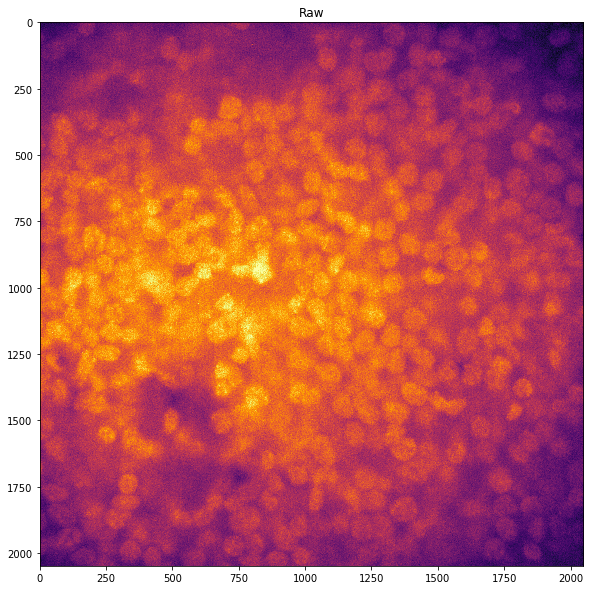

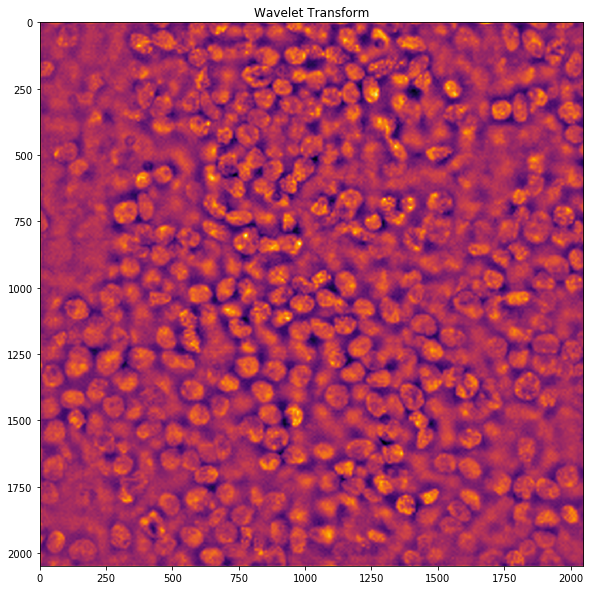

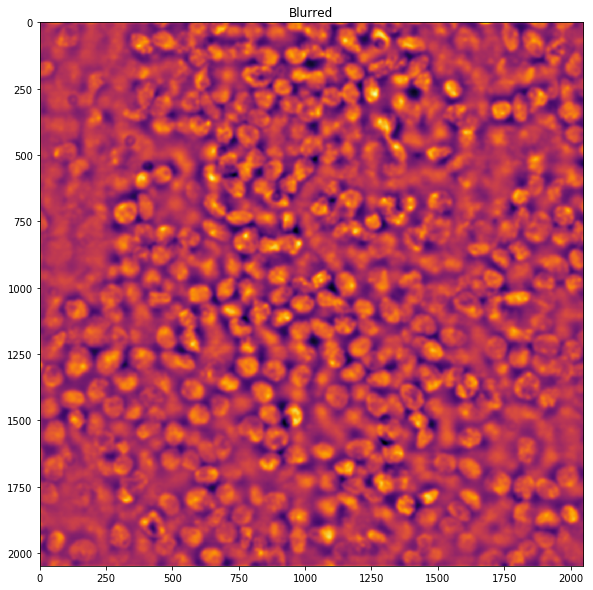

threshold


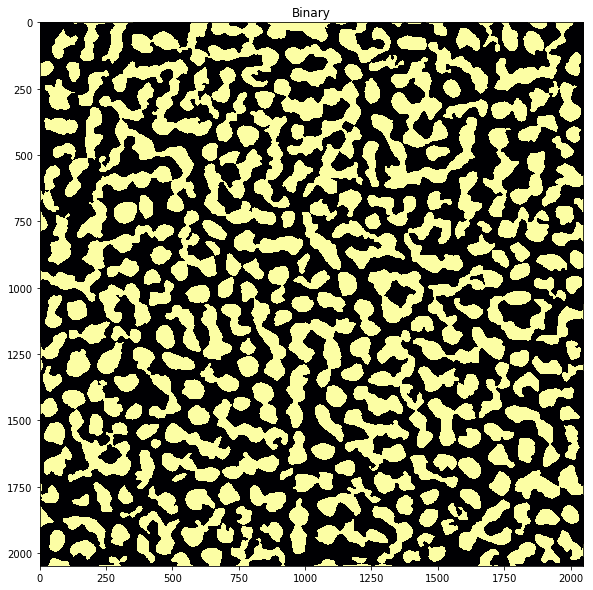

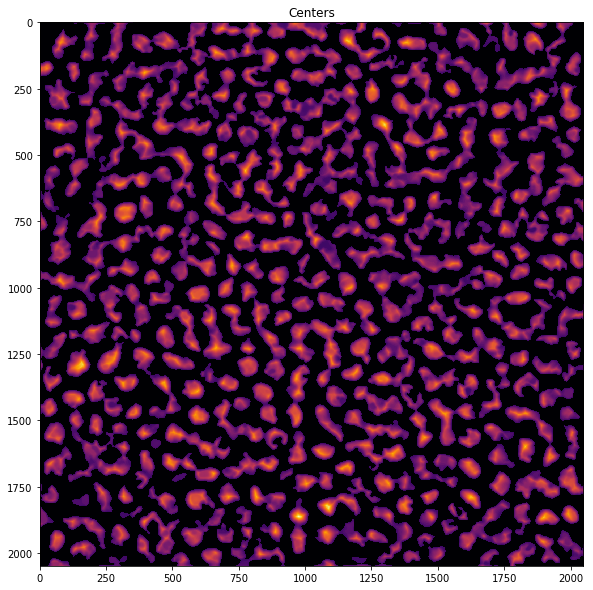

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:14: DeprecationWarning: This function is deprecated. Please call randint(0, 255 + 1) instead
  


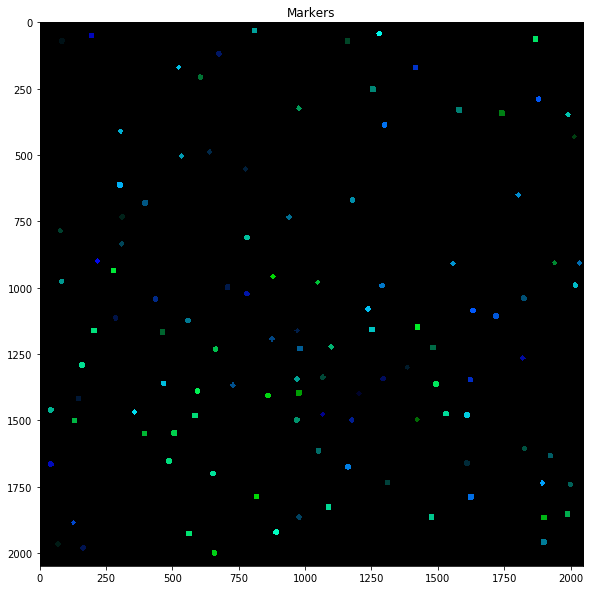

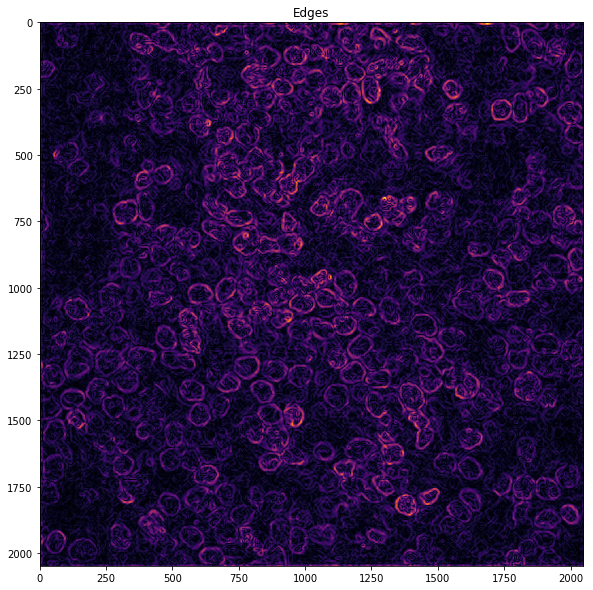

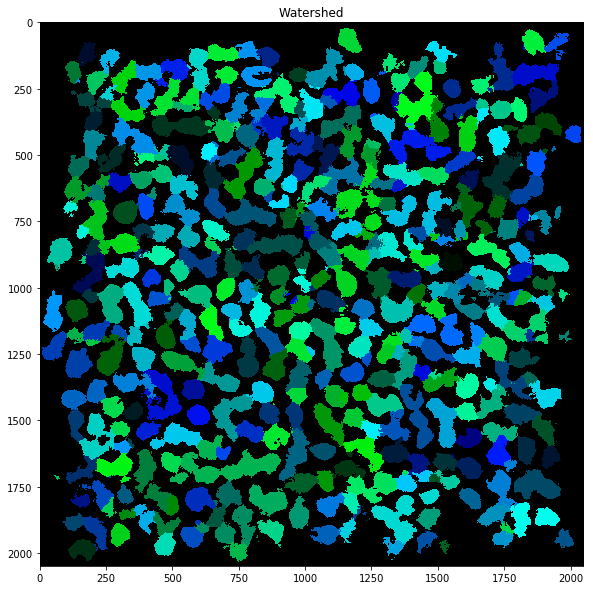

started at 2019-01-30 17:02:08.043996
ended at 2019-01-30 18:54:41.095875


In [1]:
from skimage.measure import regionprops
def colorize_segmented_image(img, color_type):
    """
    Returns a randomly colorized segmented image for display purposes.
    :param img: Should be a numpy array of dtype np.int and 2D shape segmented
    :param color_type: 'rg' for red green gradient, 'rb' = red blue, 'bg' = blue green
    :return: Randomly colorized, segmented image (shape=(n,m,3))
    """
    # get empty rgb_img as a skeleton to add colors
    rgb_img = np.zeros((img.shape[0], img.shape[1], 3))

    # make your colors
    num_cells = np.max(img)  # find the number of cells so you know how many colors to make
    colors = np.random.random_integers(0, 255, (num_cells, 3))
    if 'r' in color_type:
        if 'g' in color_type:
            colors[:, 2] = 0  # remove blue
        else:
            colors[:, 1] = 0  # remove green
    else:
        colors[:, 0] = 0  # remove red

    regions = regionprops(img)
    for i in range(1, len(regions)):  # start at 1 because no need to replace background (0s already)
        rgb_img[list(regions[i].coords.T)] = colors[i]  # won't use the 1st color

    return rgb_img.astype(np.int)

def Display(img,title='Figure',cmap='inferno',figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(img,cmap=cmap)
    plt.show()
    
def Normalize(data,min_perc=1,max_perc=99):
    data = data.astype('float64')
    data_mmin = data-np.percentile(data.ravel(),1)
    data = (data_mmin)/(np.percentile(data_mmin.ravel(),99))
    return data

import pywt
import numpy as np
import datetime
from segmentation_3D import *
from skimage.external import tifffile
import matplotlib.pyplot as plt
%matplotlib inline
start = datetime.datetime.now()
"""Load Images"""
from metadata import Metadata
import matplotlib.pyplot as plt
import pickle
#spots = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_Third_2018Dec20/results/FilteredSpots.pkl','rb'))
img_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/'
md = Metadata(img_path)
pos = 'Pos8'
print('Posname ',pos)
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_14')
fname = '/home/zach/Desktop/Raw_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(np.swapaxes(nucstk,0,2),1,2), metadata={'axes': 'ZYX'})
Display(nucstk[:,:,40],title='Raw')

wavelet = 'db9'
Result = []
for z in range(nucstk.shape[2]):
    img = nucstk[:,:,z].copy()
    coeffs = pywt.wavedec2(img,wavelet)
    keep_list = [4,5,6]
    for i in range(1,len(coeffs)+1):
        if i in keep_list:
            continue
        coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
    result = pywt.waverec2(coeffs,wavelet)
    Result.append(result)
Result  = np.array(Result)
Result = np.swapaxes(Result,0,2)
ref = Result.astype('float64')
ref_mmin = ref-np.percentile(ref.ravel(),1)
ref = (ref_mmin)/(np.percentile(ref_mmin.ravel(),99))
fname = '/home/zach/Desktop/Wavelet_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(Result,0,2), metadata={'axes': 'ZYX'})
Display(Result[:,:,40],title='Wavelet Transform')

params = {
'clip_limit' : 0.17, # 0-1
'background_blur' : 180, #block size I think?
'image_blur' : 4.0, #gaussian kernal
'threshold' : 60, #0-1
'smallest_object' : 900, #pixels
'dist_intensity_ratio' : 0.75, #0-1 weight
'separation_distance' : 40, #pixels
'edge_filter_blur' : 2.0, #kernel width in pixels
'watershed_ratio' : 0.75, #0-1 ratio of distance from edge vs bwgeodesic
'remove_image_edges': 1, # If true set all edges to 0
         }

blurred = blur(Result, params['image_blur'])
fname = '/home/zach/Desktop/Blur_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(blurred,0,2), metadata={'axes': 'ZYX'})
Display(blurred[:,:,40],title='Blurred')

im_bin = threshold(blurred, params['threshold'])
print('threshold')
im_bin = object_filter(im_bin, params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

[cell_center, d_mat] = cell_centers(blurred, im_bin, params['dist_intensity_ratio'])
fname = '/home/zach/Desktop/cell_centers_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(cell_center,0,2), metadata={'axes': 'ZYX'})
Display(cell_center[:,:,40],title='Centers')

markers = fg_markers(cell_center, im_bin, params['separation_distance'], params['remove_image_edges'])
fname = '/home/zach/Desktop/markers_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(markers,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(markers[:,:,40], 'bg')
Display(out,title='Markers')

im_edge = sobel_edges(Result, params['edge_filter_blur'])
fname = '/home/zach/Desktop/im_edge_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(im_edge,0,2), metadata={'axes': 'ZYX'})
Display(im_edge[:,:,40],title='Edges')

im = watershed(markers, im_bin, im_edge, d_mat, params['watershed_ratio'], params['remove_image_edges'])
fname = '/home/zach/Desktop/watershed_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(im,0,2), metadata={'axes': 'ZYX'})
out = colorize_segmented_image(im[:,:,40], 'bg')
Display(out,title='Watershed')

end = datetime.datetime.now()
print('started at',start)
print('ended at',end)

In [10]:
from analysis_scripts.parse_classification_images import *
from fish_results import HybeData
import os
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
ncpu = 1
pos = 'Pos2'
seqfish_config = importlib.import_module('seqfish_config_inflammation')
cvectors = seqfish_config.norm_all_codeword_vectors
try:
    genes = seqfish_config.gids+seqfish_config.bids
except:
    genes = seqfish_config.gids
hdata = HybeData(os.path.join(cstk_path,pos))
multi_z_class_parse_wrapper(hdata, cvectors, genes)

Pos2


KeyboardInterrupt: 

In [ ]:
spotcalls = []
for zindex in hdata.metadata.zindex.unique():
    try:
        spotcalls.append(hdata.load_data(hdata.posname,zindex,'spotcalls'))
    except:
        continue
spotcalls = pd.concat(spotcalls,ignore_index=True)
pickle.dump(spotcalls,open(os.path.join(cstk_path,'spotcalls.pkl'),'wb'))

In [ ]:
spotcalls

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
temp_df = spotcalls
plt.hist(temp_df.ave,bins=int(len(temp_df.ave)/1000))
plt.xlim([0,3500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')
plt.show()

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(spotcalls.gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()

In [ ]:
FISH_Spots

In [1]:
import pickle
spots = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/Pos53/spotcalls_Pos53_z_9.pkl','rb'))


In [72]:
from fish_results import HybeData
import importlib
import os
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
seqfish_config = importlib.import_module('seqfish_config_inflammation')
cvectors = seqfish_config.norm_all_codeword_vectors
poses = ['Pos271','Pos310','Pos281','Pos145','Pos7','Pos219','Pos228','Pos62',
         'Pos178','Pos99','Pos141','Pos155','Pos76','Pos70','Pos251','Pos59',
         'Pos140','Pos246','Pos161','Pos311','Pos105','Pos26','Pos304','Pos97']
try:
    genes = seqfish_config.gids+seqfish_config.bids
except:
    genes = seqfish_config.gids
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
spotcalls = []
for hdata in hybedatas:
    for zindex in hdata.metadata.zindex.unique():
        try:
            spotcalls.append(hdata.load_data(hdata.posname,zindex,'spotcalls'))
        except:
            continue
spotcalls = pd.concat(spotcalls,ignore_index=True)

In [24]:
from fish_results import HybeData
from analysis_scripts.iterative_classify_codestacks import *
poses = ['Pos271','Pos310','Pos281','Pos145','Pos7','Pos219','Pos228','Pos62',
         'Pos178','Pos99','Pos141','Pos155','Pos76','Pos70','Pos251','Pos59',
         'Pos140','Pos246','Pos161','Pos311','Pos105','Pos26','Pos304','Pos97']
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
cur_nf = np.array(np.nanmean([mean_nfs(hdata) for hdata in hybedatas], axis=0))
print(cur_nf)

/home/zach/PythonRepos/PySpots/analysis_scripts/iterative_classify_codestacks.py:46: RuntimeWarning: Mean of empty slice
  return np.nanmean(nfs, axis=0)


[ 754.65438027  744.98721313  425.30239698  470.40240733  642.7088328
  548.7349548   618.62660859  665.42199577 1380.51892489  810.34758434
 1064.07035485 2259.56054454  451.9172002   448.99305347  515.86222524
 2870.2956101  2160.86642142 2039.42218353]


In [73]:
spotcalls

,gene,ssum,centroid,ave,npixels,cword_idx,z,posname
0,Ptger4,3409.0,"(0.0, 262.0)",852.250000,1,122,5,Pos271
1,Ptger4,13246.0,"(1.0, 326.0)",662.300000,5,122,5,Pos271
2,Srf,1669.0,"(0.0, 1922.0)",417.250000,1,146,5,Pos271
3,Tnfrsf11a,14499.0,"(1.5, 1239.5)",906.187500,4,164,5,Pos271
4,Relt,1436.0,"(1.0, 1685.0)",359.000000,1,132,5,Pos271
5,Creb5,4596.0,"(1.5, 1989.0)",574.500000,2,40,5,Pos271
6,Vps35,1630.0,"(3.0, 1062.0)",407.500000,1,169,5,Pos271
7,Tnfrsf11a,2549.0,"(3.0, 1096.0)",637.250000,1,164,5,Pos271
8,Lrp6,1722.0,"(3.0, 1999.0)",430.500000,1,85,5,Pos271
9,Creb5,3068.0,"(4.0, 1337.0)",767.000000,1,40,5,Pos271


SpearmanrResult(correlation=0.07568455219131341, pvalue=0.32807408276025873)


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log2
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log2


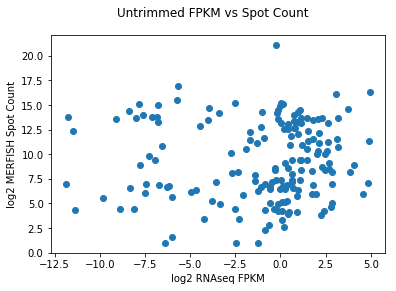

In [74]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots = Counter(spotcalls.gene)
for gn,cc in FISH_Spots.items():
    if 'blank' in gn:
        continue
    else:
        gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        if len(fpkm)>0:
            if cc<2:
                continue
            vals.append((fpkm[0],cc))
fpkms,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(fpkms),np.log2(ccs))
print(spearmanr(np.log2(fpkms),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()

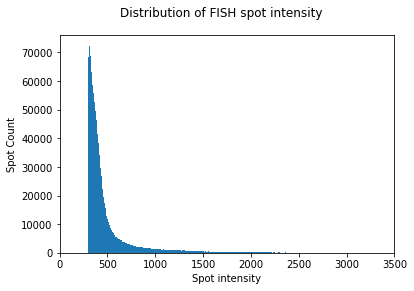

In [75]:
%matplotlib inline
import matplotlib.pyplot as plt
temp_df = spotcalls
plt.hist(temp_df.ave,bins=int(len(temp_df.ave)/1000))
plt.xlim([0,3500])
plt.suptitle('Distribution of FISH spot intensity')
plt.xlabel('Spot intensity')
plt.ylabel('Spot Count')
plt.show()

In [76]:
for pos in spotcalls.posname.unique():
    print(pos)
    print(np.mean(spotcalls[spotcalls.posname==pos].ave))
    print(len(spotcalls[spotcalls.posname==pos]))

Pos271
837.8173539918047
88120
Pos310
352.00932631278187
31225
Pos281
526.3021220597585
34110
Pos145
768.5062435902489
63859
Pos7
901.574385322151
69958
Pos219
605.2886445140286
52972
Pos228
632.552945184866
55493
Pos62
333.20364448867934
29622
Pos178
650.9584652063331
59706
Pos99
752.1291844795792
50309
Pos141
833.7708881990654
73353
Pos155
800.5529770252078
73648
Pos76
339.68454157413726
29224
Pos70
795.2949882868977
56714
Pos251
637.8552214194661
42926
Pos59
798.6868185466448
53500
Pos140
783.5042467245136
82523
Pos246
553.5336127812647
47301
Pos161
757.9019797738418
64141
Pos311
339.51746491510727
35097
Pos105
389.5839301784782
2132477
Pos26
567.1329652444022
42131
Pos304
533.968035988323
41369


SpearmanrResult(correlation=0.9185469571254321, pvalue=1.1964509225329175e-54)


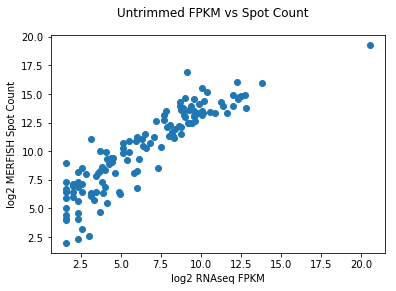

In [90]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os
ReadsPerGene = pd.read_excel('/bigstore/GeneralStorage/Zach/Cornea_RNAseq/Aligned/ReadsPerGene.xlsx')
GeneList = pd.read_excel('/bigstore/GeneralStorage/Zach/MERFISH/Inflammatory/InflammationGeneList.xlsx')
vals = []
FISH_Spots1 = Counter(spotcalls.gene[0:int((len(spotcalls)/2)-1)])
FISH_Spots2 = Counter(spotcalls.gene[int((len(spotcalls)/2)):])
for gn,cc in FISH_Spots1.items():
    if 'blank' in gn:
        continue
    else:
        #gid = GeneList.Gene_ID[GeneList.Gene==gn].tolist()[0]
        #counts = ReadsPerGene[ReadsPerGene.GeneIDs==gid].Unstranded.values
        #fpkm = counts/GeneList.Length[GeneList.Gene==gn].tolist()[0]
        cc2 = FISH_Spots2[gn]
        if cc2>2:
            if cc<2:
                continue
            vals.append((cc2,cc))
cc2,ccs = zip(*vals)
from scipy.stats import spearmanr
plt.scatter(np.log2(cc2),np.log2(ccs))
print(spearmanr(np.log2(cc2),np.log2(ccs)))
plt.suptitle('Untrimmed FPKM vs Spot Count')
plt.ylabel('log2 MERFISH Spot Count')
plt.xlabel('log2 RNAseq FPKM')
plt.show()

In [78]:
from fish_results import HybeData
import importlib
import os
cstk_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/codestacks/'
seqfish_config = importlib.import_module('seqfish_config_inflammation')
cvectors = seqfish_config.norm_all_codeword_vectors
poses = ['Pos271','Pos310','Pos281','Pos145','Pos7','Pos219','Pos228','Pos62',
         'Pos178','Pos99','Pos141','Pos155','Pos76','Pos70','Pos251','Pos59',
         'Pos140','Pos246','Pos161','Pos311','Pos105','Pos26','Pos304','Pos97']
try:
    genes = seqfish_config.gids+seqfish_config.bids
except:
    genes = seqfish_config.gids
hybedatas = [HybeData(os.path.join(cstk_path, i)) for i in poses]
spotcalls = []
for hdata in hybedatas:
    for zindex in hdata.metadata.zindex.unique():
        try:
            spotcalls.append(hdata.load_data(hdata.posname,zindex,'spotcalls'))
        except:
            continue
spotcalls = pd.concat(spotcalls,ignore_index=True)

14147

Posname  Pos8
opening img_Pos8_000000103_000000000_DeepBlue_000_103.tif

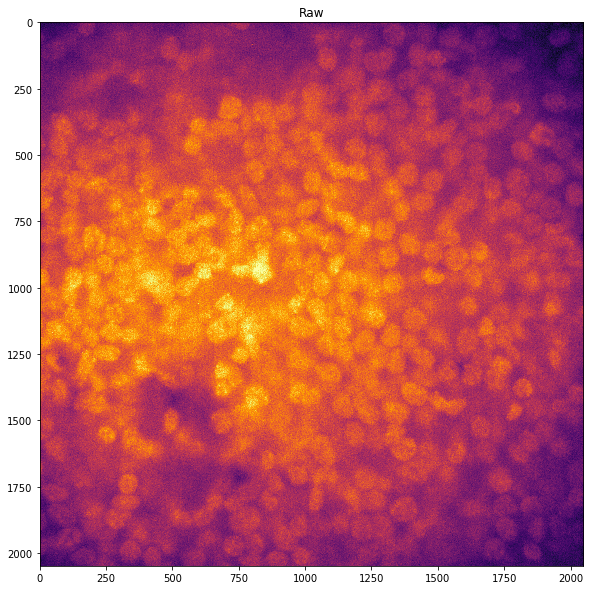

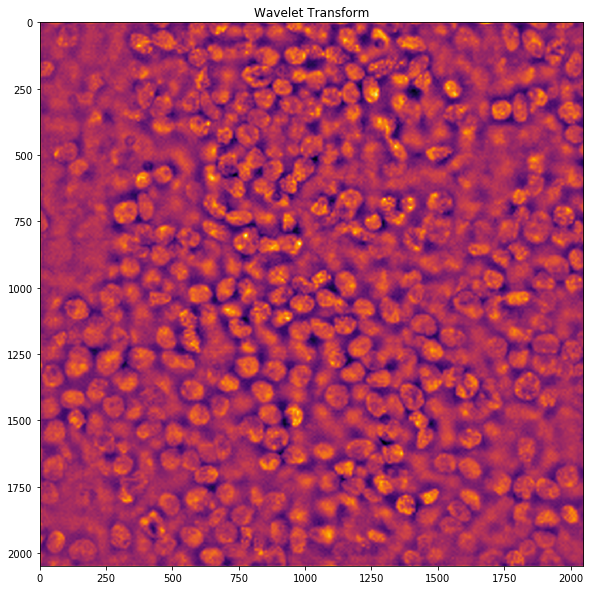

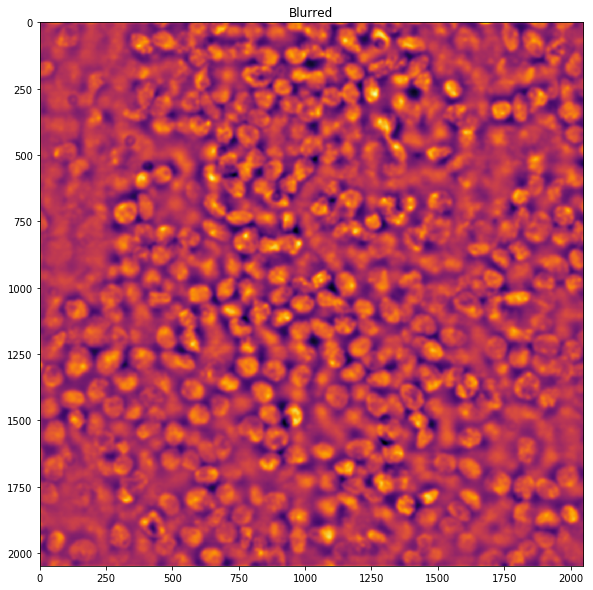

threshold


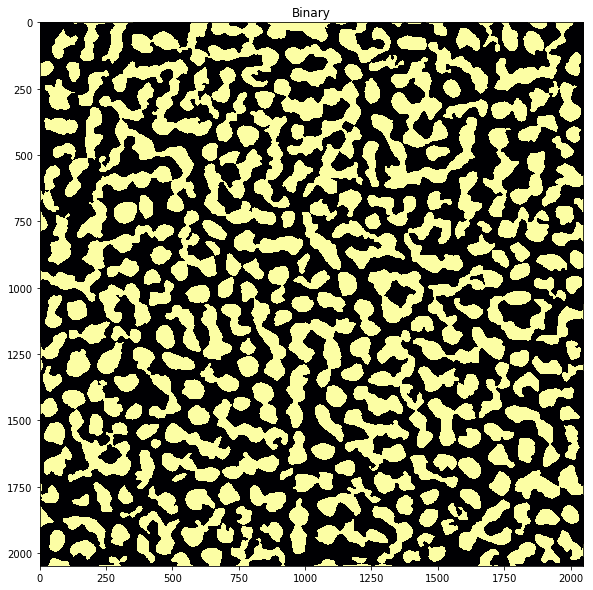

In [24]:
from skimage.measure import regionprops
def colorize_segmented_image(img, color_type):
    """
    Returns a randomly colorized segmented image for display purposes.
    :param img: Should be a numpy array of dtype np.int and 2D shape segmented
    :param color_type: 'rg' for red green gradient, 'rb' = red blue, 'bg' = blue green
    :return: Randomly colorized, segmented image (shape=(n,m,3))
    """
    # get empty rgb_img as a skeleton to add colors
    rgb_img = np.zeros((img.shape[0], img.shape[1], 3))

    # make your colors
    num_cells = np.max(img)  # find the number of cells so you know how many colors to make
    colors = np.random.random_integers(0, 255, (num_cells, 3))
    if 'r' in color_type:
        if 'g' in color_type:
            colors[:, 2] = 0  # remove blue
        else:
            colors[:, 1] = 0  # remove green
    else:
        colors[:, 0] = 0  # remove red

    regions = regionprops(img)
    for i in range(1, len(regions)):  # start at 1 because no need to replace background (0s already)
        rgb_img[list(regions[i].coords.T)] = colors[i]  # won't use the 1st color

    return rgb_img.astype(np.int)

def Display(img,title='Figure',cmap='inferno',figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(img,cmap=cmap)
    plt.show()
    
def Normalize(data,min_perc=1,max_perc=99):
    data = data.astype('float64')
    data_mmin = data-np.percentile(data.ravel(),1)
    data = (data_mmin)/(np.percentile(data_mmin.ravel(),99))
    return data

import pywt
import numpy as np
import datetime
from segmentation_3D import *
from skimage.external import tifffile
import matplotlib.pyplot as plt
%matplotlib inline
start = datetime.datetime.now()
"""Load Images"""
from metadata import Metadata
import matplotlib.pyplot as plt
import pickle
#spots = pickle.load(open('/hybedata/Images/Zach/FISH_Troubleshooting/Predigest_WholeMount_Third_2018Dec20/results/FilteredSpots.pkl','rb'))
img_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/'
md = Metadata(img_path)
pos = 'Pos8'
print('Posname ',pos)
nucstk = md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_14')
fname = '/home/zach/Desktop/Raw_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(np.swapaxes(nucstk,0,2),1,2), metadata={'axes': 'ZYX'})
Display(nucstk[:,:,40],title='Raw')

wavelet = 'db9'
Result = []
for z in range(nucstk.shape[2]):
    img = nucstk[:,:,z].copy()
    coeffs = pywt.wavedec2(img,wavelet)
    keep_list = [4,5,6]
    for i in range(1,len(coeffs)+1):
        if i in keep_list:
            continue
        coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
    result = pywt.waverec2(coeffs,wavelet)
    Result.append(result)
Result  = np.array(Result)
Result = np.swapaxes(Result,0,2)
ref = Result.astype('float64')
ref_mmin = ref-np.percentile(ref.ravel(),1)
ref = (ref_mmin)/(np.percentile(ref_mmin.ravel(),99))
fname = '/home/zach/Desktop/Wavelet_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(Result,0,2), metadata={'axes': 'ZYX'})
Display(Result[:,:,40],title='Wavelet Transform')

params = {
'clip_limit' : 0.17, # 0-1
'background_blur' : 180, #block size I think?
'image_blur' : 4.0, #gaussian kernal
'threshold' : 60, #0-1
'smallest_object' : 900, #pixels
'dist_intensity_ratio' : 0.75, #0-1 weight
'separation_distance' : 40, #pixels
'edge_filter_blur' : 2.0, #kernel width in pixels
'watershed_ratio' : 0.75, #0-1 ratio of distance from edge vs bwgeodesic
'remove_image_edges': 1, # If true set all edges to 0
         }

blurred = blur(Result, params['image_blur'])
fname = '/home/zach/Desktop/Blur_Pos8.tiff'
tifffile.imsave(fname, np.swapaxes(blurred,0,2), metadata={'axes': 'ZYX'})
Display(blurred[:,:,40],title='Blurred')

im_bin = threshold(blurred, params['threshold'])
print('threshold')
im_bin = object_filter(im_bin, params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

threshold


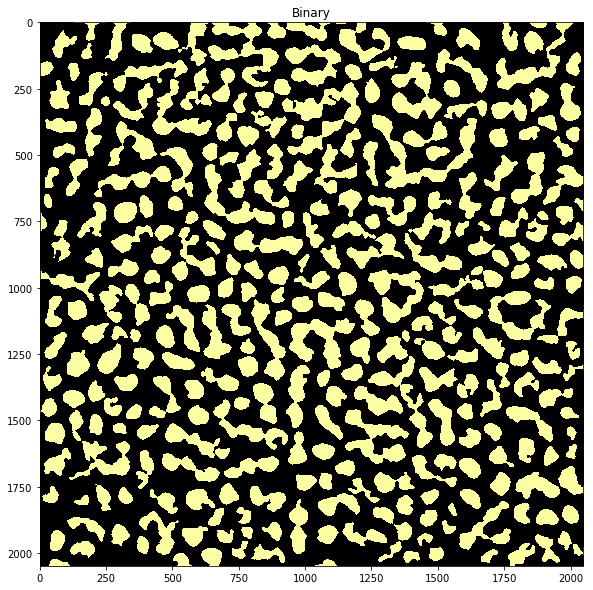

In [40]:
%matplotlib inline
params = {
'clip_limit' : 0.17, # 0-1
'background_blur' : 180, #block size I think?
'image_blur' : 4.0, #gaussian kernal
'threshold' : 70, #0-1
'smallest_object' : 900, #pixels
'dist_intensity_ratio' : 0.75, #0-1 weight
'separation_distance' : 40, #pixels
'edge_filter_blur' : 2.0, #kernel width in pixels
'watershed_ratio' : 0.75, #0-1 ratio of distance from edge vs bwgeodesic
'remove_image_edges': 1, # If true set all edges to 0
         }
im_bin = threshold(blurred, params['threshold'])
print('threshold')
im_bin = object_filter(im_bin, params['smallest_object'])
Display(im_bin[:,:,40],title='Binary')

In [32]:
pywt.wavelist()

['bior1.1',
 'bior1.3',
 'bior1.5',
 'bior2.2',
 'bior2.4',
 'bior2.6',
 'bior2.8',
 'bior3.1',
 'bior3.3',
 'bior3.5',
 'bior3.7',
 'bior3.9',
 'bior4.4',
 'bior5.5',
 'bior6.8',
 'cgau1',
 'cgau2',
 'cgau3',
 'cgau4',
 'cgau5',
 'cgau6',
 'cgau7',
 'cgau8',
 'cmor',
 'coif1',
 'coif2',
 'coif3',
 'coif4',
 'coif5',
 'coif6',
 'coif7',
 'coif8',
 'coif9',
 'coif10',
 'coif11',
 'coif12',
 'coif13',
 'coif14',
 'coif15',
 'coif16',
 'coif17',
 'db1',
 'db2',
 'db3',
 'db4',
 'db5',
 'db6',
 'db7',
 'db8',
 'db9',
 'db10',
 'db11',
 'db12',
 'db13',
 'db14',
 'db15',
 'db16',
 'db17',
 'db18',
 'db19',
 'db20',
 'db21',
 'db22',
 'db23',
 'db24',
 'db25',
 'db26',
 'db27',
 'db28',
 'db29',
 'db30',
 'db31',
 'db32',
 'db33',
 'db34',
 'db35',
 'db36',
 'db37',
 'db38',
 'dmey',
 'fbsp',
 'gaus1',
 'gaus2',
 'gaus3',
 'gaus4',
 'gaus5',
 'gaus6',
 'gaus7',
 'gaus8',
 'haar',
 'mexh',
 'morl',
 'rbio1.1',
 'rbio1.3',
 'rbio1.5',
 'rbio2.2',
 'rbio2.4',
 'rbio2.6',
 'rbio2.8',
 'rbio3.1',

In [54]:

print(pywt.Wavelet('sym2'))

Wavelet sym2
  Family name:    Symlets
  Short name:     sym
  Filters length: 4
  Orthogonal:     True
  Biorthogonal:   True
  Symmetry:       near symmetric
  DWT:            True
  CWT:            False


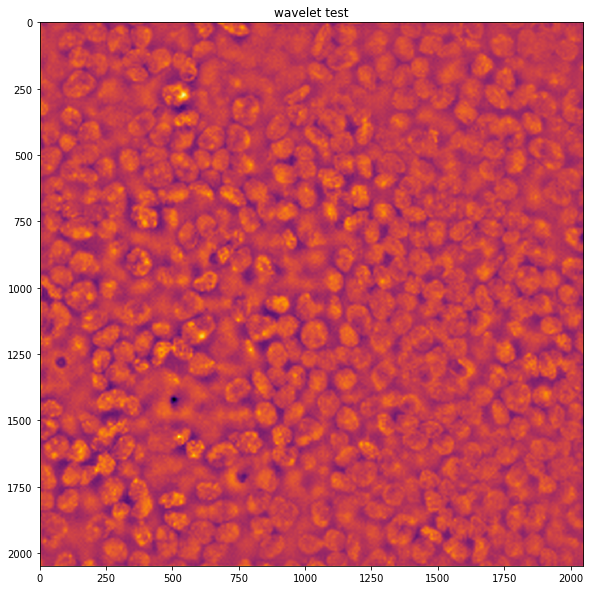

In [98]:
wavelet = 'db9'
img = nucstk[:,:,20].copy()
coeffs = pywt.wavedec2(img,wavelet)
keep_list = [4,5,6]
for i in range(1,len(coeffs)+1):
    if i in keep_list:
        continue
    coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
result = pywt.waverec2(coeffs,wavelet)
Display(result,title='wavelet test')

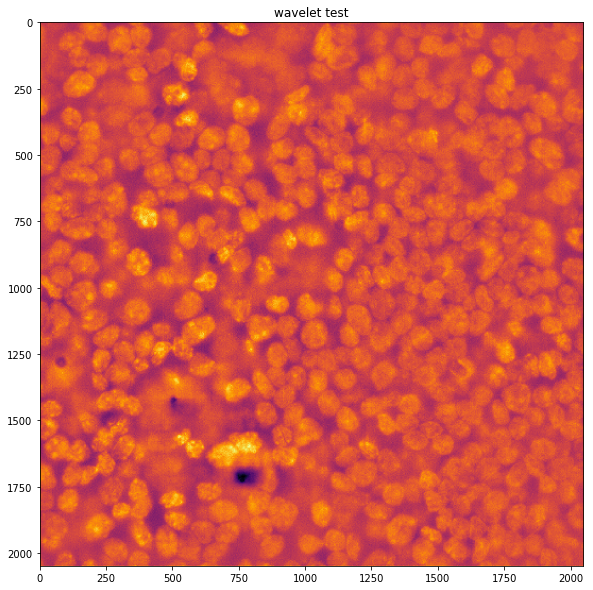

In [100]:
wavelet = 'sym3'
img = nucstk[:,:,20].copy()
coeffs = pywt.wavedec2(img,wavelet)
keep_list = [3,4,5,6,7]
for i in range(1,len(coeffs)+1):
    if i in keep_list:
        continue
    coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
result = pywt.waverec2(coeffs,wavelet)
Display(result,title='wavelet test')

In [57]:
coeffs = pywt.wavedec2(img,wavelet)

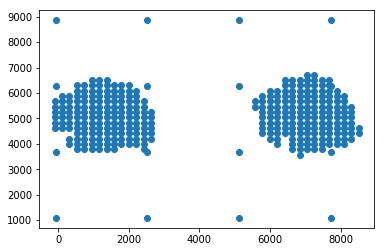

In [92]:
from metadata import Metadata
md = Metadata('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/')
pos_df = {}
for pos in md.image_table.Position.unique():
    if 'Pos' in pos:
        pos_df[pos] = md.image_table[md.image_table.Position==pos].XY.iloc[0]
pos_x = []
pos_y = []
for pos in pos_df:
    pos_x.append(pos_df[pos][0])
    pos_y.append(pos_df[pos][1])%matplotlib inline
plt.scatter(pos_x,pos_y)

<IPython.core.display.Javascript object>


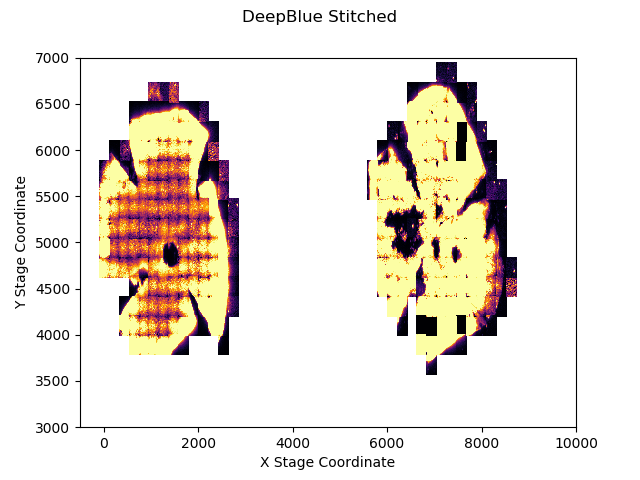

opening img_Pos2_000000040_000000000_DeepBlue_000_040.tifff

In [11]:
%matplotlib notebook
from metadata import Metadata
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
import pywt
from matplotlib.transforms import Bbox, TransformedBbox
import numpy as np
img_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/'
#md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
pos_df = {}
wavelet = 'db9'
for pos in md.image_table.Position.unique():
    if 'Pos' in pos:
        pos_df[pos] = md.image_table[md.image_table.Position==pos].XY.iloc[0]
        x = pos_df[pos][0]
        y = pos_df[pos][1]
        im = np.flipud(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_14',Zindex=40)[:,:,0])
#         coeffs = pywt.wavedec2(im,wavelet)
#         keep_list = [4,5,6]
#         for i in range(1,len(coeffs)+1):
#             if i in keep_list:
#                 continue
#             coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
#         im = pywt.waverec2(coeffs,wavelet)
        bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False,
                            cmap='inferno')
        bbox_image.set_data(im)
        ax.add_artist(bbox_image)
ax.set_xlim(-500,10000)
ax.set_ylim(3000,7000)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('DeepBlue Stitched')
plt.show()
fig.savefig('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/DeepBlueStitched')

<IPython.core.display.Javascript object>


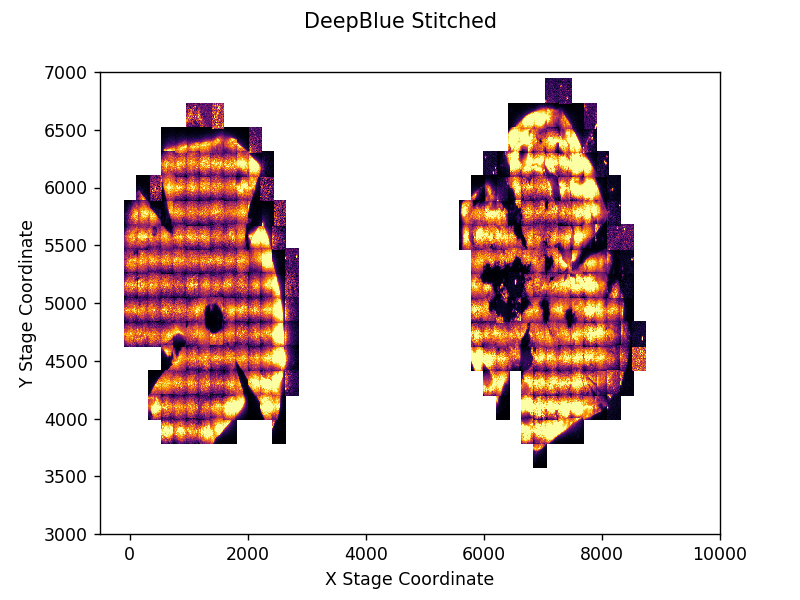

opening img_Pos2_000000040_000000000_DeepBlue_000_040.tifff

In [39]:
%matplotlib notebook
from metadata import Metadata
from matplotlib import pyplot as plt
from skimage.transform import resize
from matplotlib.image import BboxImage
import pywt
from matplotlib.transforms import Bbox, TransformedBbox
import numpy as np
img_path = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/'
#md = Metadata(img_path)
fig = plt.figure()
ax = fig.add_subplot(111)
artists = []
pos_df = {}
wavelet = 'db9'
for pos in md.image_table.Position.unique():
    if 'Pos' in pos:
        pos_df[pos] = md.image_table[md.image_table.Position==pos].XY.iloc[0]
        x = pos_df[pos][0]
        y = pos_df[pos][1]
        im = np.flipud(md.stkread(Position=pos,Channel='DeepBlue',acq='nucstain_dim_15',Zindex=40)[:,:,0])
#         coeffs = pywt.wavedec2(im,wavelet)
#         keep_list = [4,5,6]
#         for i in range(1,len(coeffs)+1):
#             if i in keep_list:
#                 continue
#             coeffs[-i] = tuple([np.zeros_like(v) for v in coeffs[-i]])
#         im = pywt.waverec2(coeffs,wavelet)
        bb = Bbox.from_bounds(x,y,2048*0.109,2048*0.109)
        bb2 = TransformedBbox(bb,ax.transData)
        bbox_image = BboxImage(bb2,
                            norm = None,
                            origin=None,
                            clip_on=False,
                            cmap='inferno')
        bbox_image.set_data(im)
        ax.add_artist(bbox_image)
ax.set_xlim(-500,10000)
ax.set_ylim(3000,7000)
plt.xlabel('X Stage Coordinate')
plt.ylabel('Y Stage Coordinate')
plt.suptitle('DeepBlue Stitched')
plt.show()
fig.savefig('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/DeepBlueStitched_dim')

In [6]:
im

array([[5138.79970423, 3678.81269327, 2640.93496603, ..., 2515.21819544,
        3022.93823075, 3767.3412754 ],
       [3971.43999913, 2556.74781535, 1596.2676705 , ..., 2339.620962  ,
        2861.92832139, 3593.7708232 ],
       [3116.0793676 , 1773.07818844,  892.60276732, ..., 2301.30657063,
        2815.64678753, 3515.08645016],
       ...,
       [4119.24301518, 2501.48122145, 1367.72774933, ..., 1795.67102932,
        2682.74081293, 3788.41523534],
       [4902.50630064, 3587.18858757, 2697.36757276, ..., 2823.51292958,
        3494.58322932, 4355.22692517],
       [5793.71941784, 4911.35374587, 4368.15336536, ..., 4063.80265888,
        4459.85890682, 5010.30470261]])

In [14]:
Unwounded_pos = []
Wounded_pos = []
for pos in md.image_table.Position.unique():
    if 'Pos' in pos:
        pos_df[pos] = md.image_table[md.image_table.Position==pos].XY.iloc[0]
        if pos_df[pos][0]<4000:
            Wounded_pos.append(pos)
        else:
            Unwounded_pos.append(pos)
print(len(Unwounded_pos),' Unwounded Positions')
print(len(Wounded_pos),' Wounded Positions')

158  Unwounded Positions
154  Wounded Positions


In [15]:
Wounded_pos

['Pos1',
 'Pos7',
 'Pos8',
 'Pos9',
 'Pos10',
 'Pos11',
 'Pos20',
 'Pos19',
 'Pos18',
 'Pos17',
 'Pos16',
 'Pos27',
 'Pos26',
 'Pos25',
 'Pos15',
 'Pos14',
 'Pos24',
 'Pos23',
 'Pos36',
 'Pos37',
 'Pos38',
 'Pos39',
 'Pos40',
 'Pos41',
 'Pos28',
 'Pos29',
 'Pos30',
 'Pos31',
 'Pos21',
 'Pos32',
 'Pos45',
 'Pos44',
 'Pos43',
 'Pos42',
 'Pos55',
 'Pos54',
 'Pos53',
 'Pos52',
 'Pos51',
 'Pos50',
 'Pos49',
 'Pos63',
 'Pos64',
 'Pos65',
 'Pos66',
 'Pos67',
 'Pos68',
 'Pos69',
 'Pos70',
 'Pos56',
 'Pos57',
 'Pos58',
 'Pos71',
 'Pos72',
 'Pos73',
 'Pos74',
 'Pos88',
 'Pos113',
 'Pos112',
 'Pos100',
 'Pos101',
 'Pos87',
 'Pos86',
 'Pos85',
 'Pos99',
 'Pos111',
 'Pos123',
 'Pos135',
 'Pos134',
 'Pos122',
 'Pos110',
 'Pos98',
 'Pos84',
 'Pos83',
 'Pos82',
 'Pos81',
 'Pos80',
 'Pos79',
 'Pos78',
 'Pos77',
 'Pos91',
 'Pos92',
 'Pos93',
 'Pos94',
 'Pos95',
 'Pos96',
 'Pos97',
 'Pos109',
 'Pos108',
 'Pos107',
 'Pos106',
 'Pos105',
 'Pos104',
 'Pos116',
 'Pos117',
 'Pos118',
 'Pos119',
 'Pos120',
 'P

In [27]:
import pickle
old_tforms = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/tforms.pkl','rb'))
new_tforms = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results2/tforms.pkl','rb'))
old_beads = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results/beads.pkl','rb'))
new_beads = pickle.load(open('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/results2/beads.pkl','rb'))

In [26]:
print(old_tforms['good']['Pos1'])
print(new_tforms['good']['Pos1'])

{'hybe1': (array([0, 0, 0]), 0, inf), 'hybe2': (array([-1.40004252,  0.19996828,  0.59998015]), 0.12632756339133247, 95), 'hybe3': (array([ 6.32495916e-05, -4.17933366e-02,  7.99962419e-01]), 0.15602435204260462, 93), 'hybe4': (array([2.40000805, 6.19999371, 0.20087663]), 0.22006926728201773, 113), 'hybe5': (array([ 8.80001019, 12.40000267,  0.20000706]), 0.2371328431470246, 79), 'hybe6': (array([ 3.59976607, 12.00000699, -0.20001252]), 0.21229981594888936, 114), 'hybe7': (array([ 0.40000061,  5.79999841, -0.59988244]), 0.21003847417079904, 113), 'hybe8': (array([-3.19998558,  3.99998264,  0.13066077]), 0.2604899710169823, 109), 'hybe9': (array([ 2.85340535e-05,  9.99746351e-01, -3.99761726e-01]), 0.23717492554205802, 115)}
{'hybe1': (array([0, 0, 0]), 0, inf), 'hybe2': (array([-1.40004252,  0.19996828,  0.59998015]), 0.12632756339133247, 95), 'hybe3': (array([ 6.32495916e-05, -4.17933366e-02,  7.99962419e-01]), 0.15602435204260462, 93), 'hybe4': (array([2.40000805, 6.19999371, 0.20087

In [35]:
for hybe in old_beads['Pos1'].keys():
    print(hybe,len(old_beads['Pos1'][hybe]))

hybe1 113
hybe2 96
hybe3 100
hybe4 132
hybe5 79
hybe6 134
hybe7 142
hybe8 108
hybe9 140
nucstain 0


In [36]:
for hybe in new_beads['Pos1'].keys():
    print(hybe,len(new_beads['Pos1'][hybe]))

hybe1 113
hybe2 96
hybe3 100
hybe4 132
hybe5 79
hybe6 134
hybe7 142
hybe8 108
hybe9 140
nucstain 0


opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

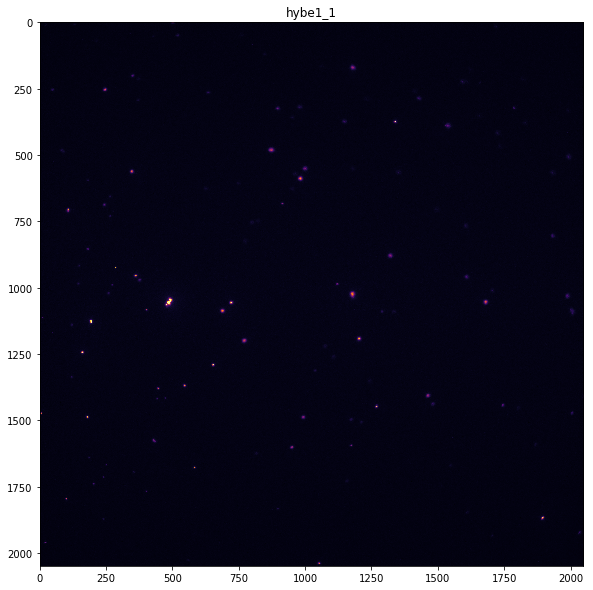

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

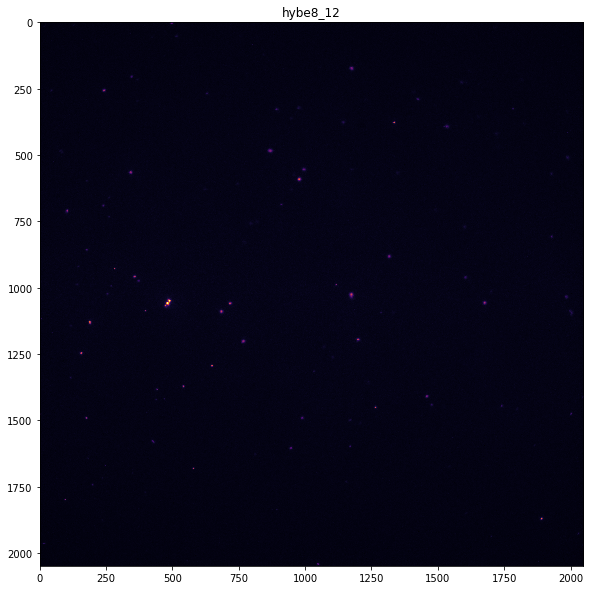

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

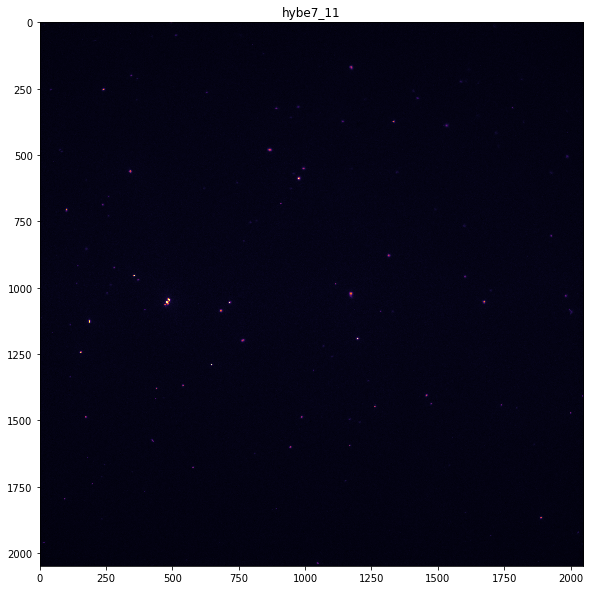

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

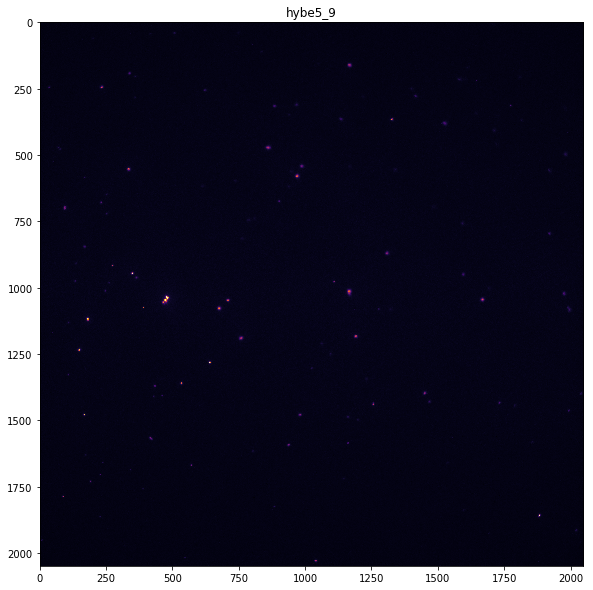

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

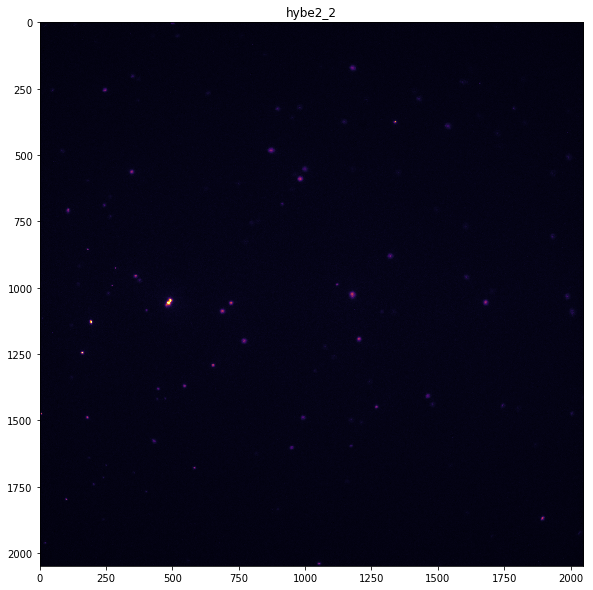

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

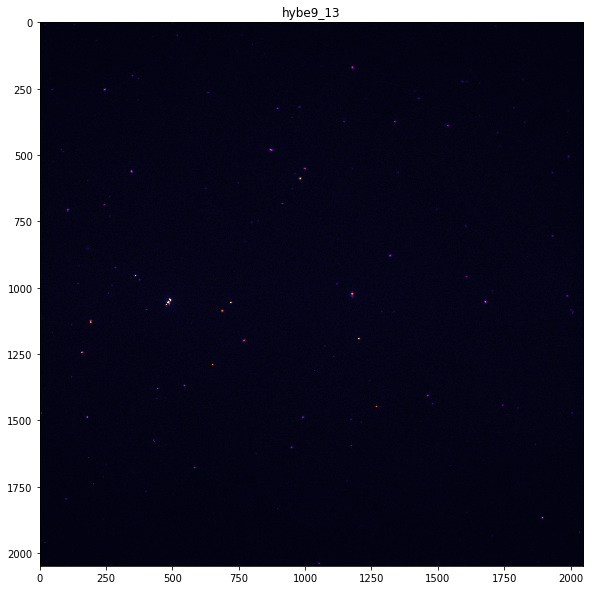

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

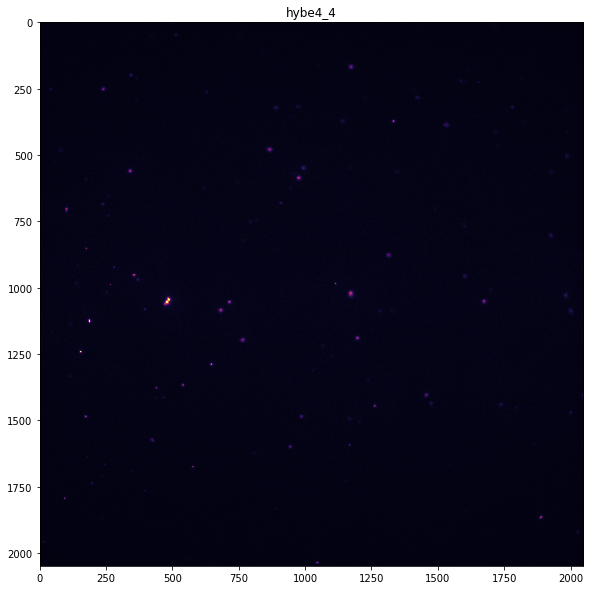

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

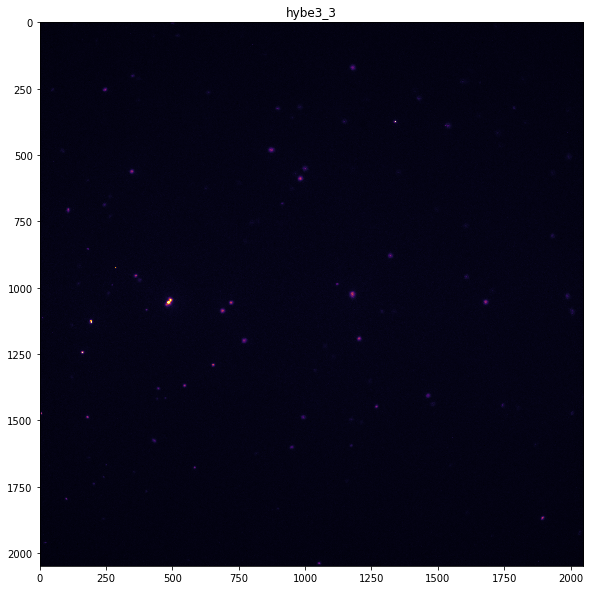

opening img_Pos1_000000005_000000000_DeepBlue_000_005.tif

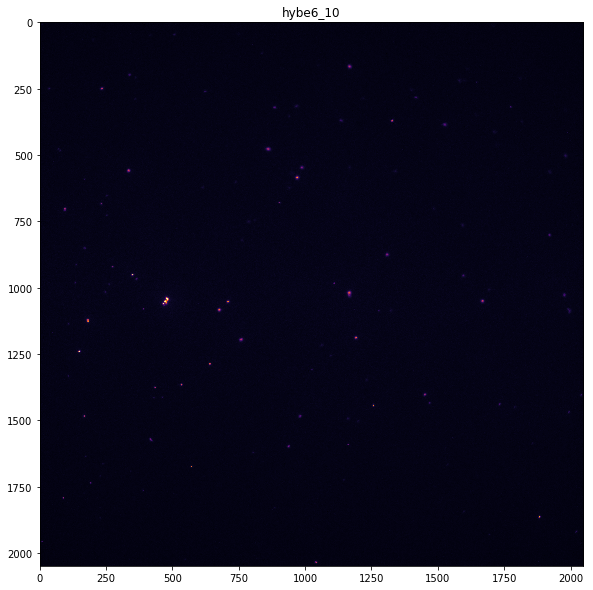

In [46]:
from metadata import Metadata
import matplotlib.pyplot as plt
%matplotlib inline
def Display(img,title='Figure',cmap='inferno',figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(img,cmap=cmap)
    plt.show()
    
#md = Metadata('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/')
pos = 'Pos1'
z = 5
for hybe in md.image_table.acq.unique():
    if 'hybe' in hybe:
        img = md.stkread(Position=pos,Channel='DeepBlue',acq=hybe,Zindex=z)
        Display(img[:,:,0],title=hybe)


opening img_Pos2_000000017_000000000_FarRed_000_017.tif

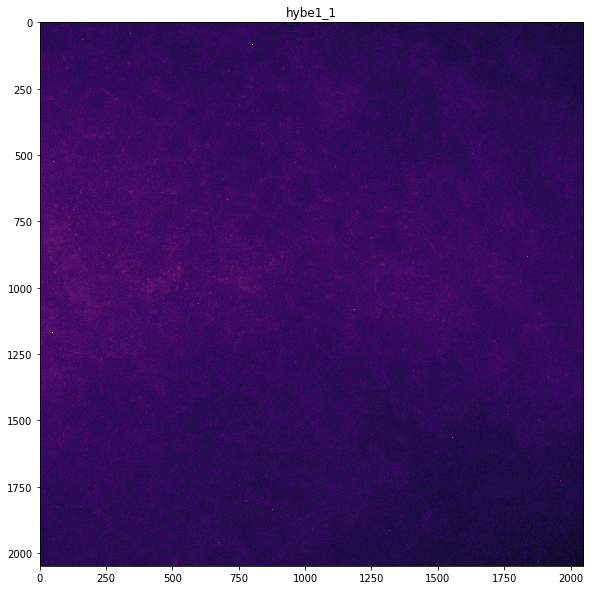

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

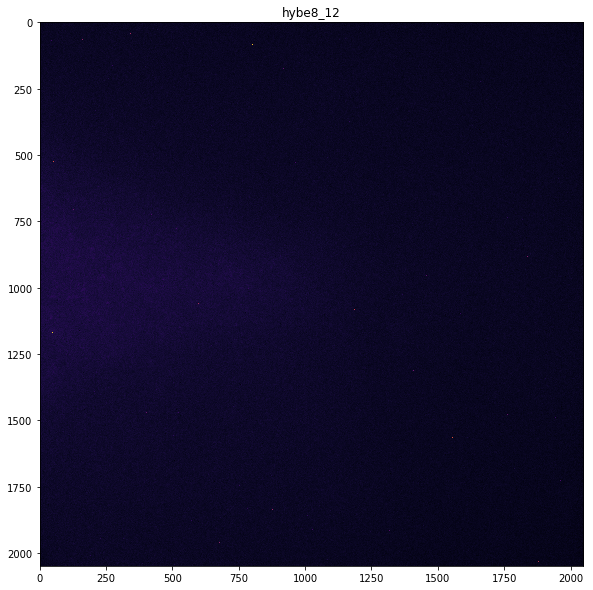

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

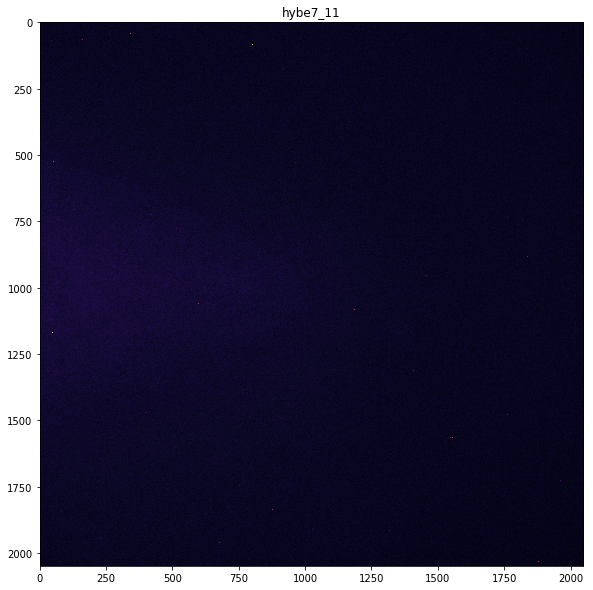

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

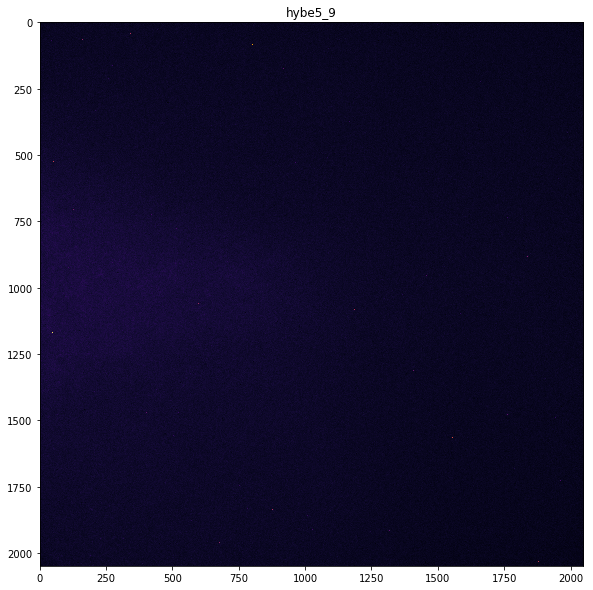

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

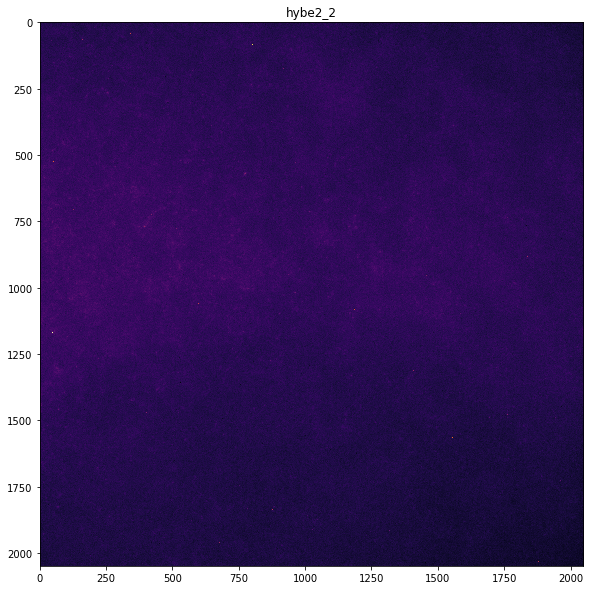

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

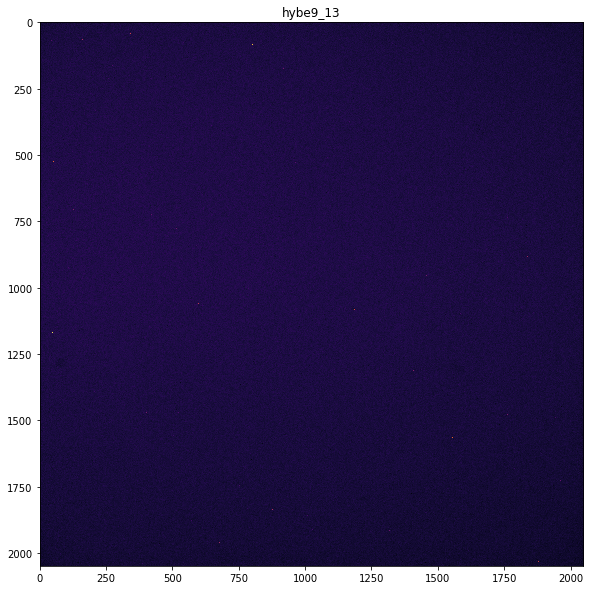

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

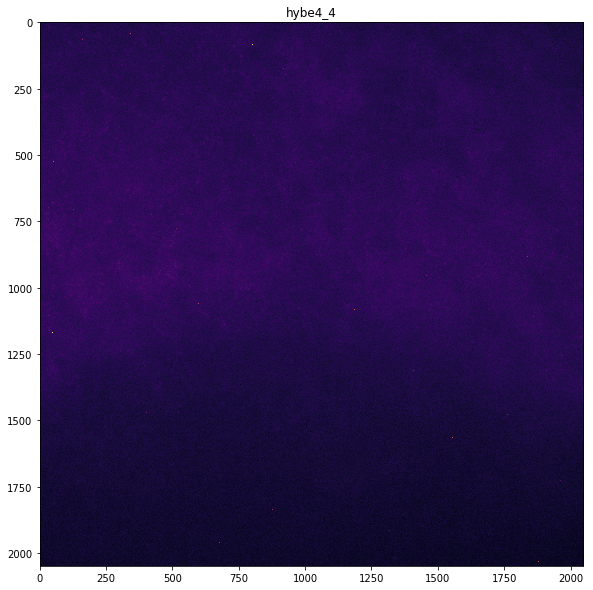

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

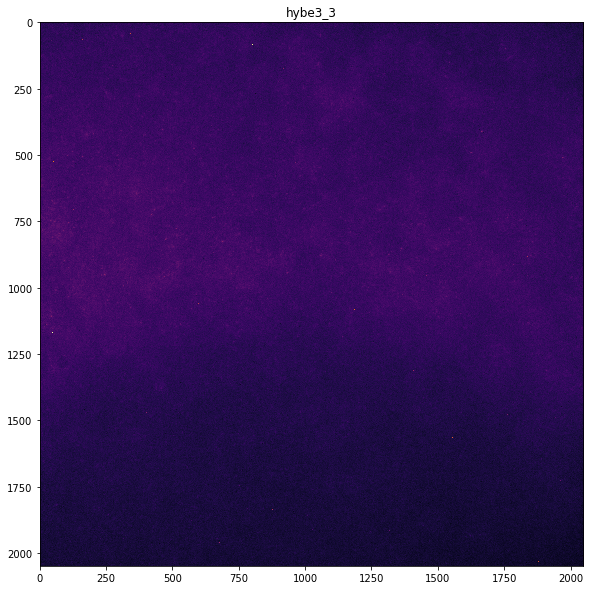

opening img_Pos2_000000017_000000000_FarRed_000_017.tif

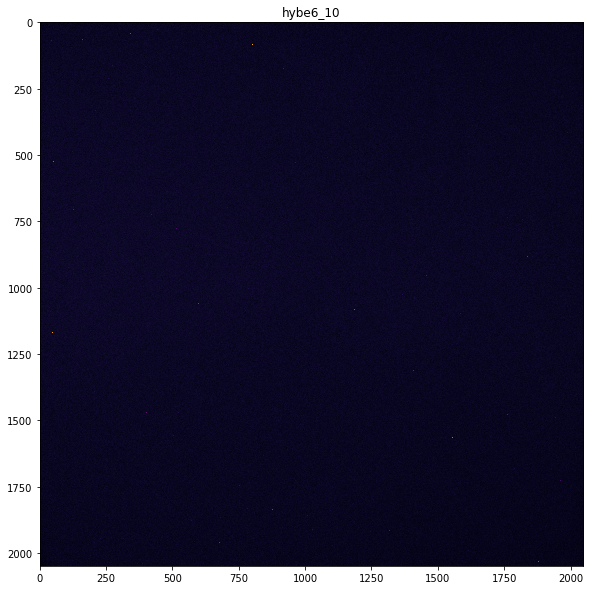

In [52]:
from metadata import Metadata
import matplotlib.pyplot as plt
%matplotlib inline
def Display(img,title='Figure',cmap='inferno',figsize=(10,10)):
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(img,cmap=cmap)
    plt.show()
    
#md = Metadata('/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_First_2019Jan19/')
pos = 'Pos2'
z = 17
for hybe in md.image_table.acq.unique():
    if 'hybe' in hybe:
        img = md.stkread(Position=pos,Channel='FarRed',acq=hybe,Zindex=z)
        Display(img[:,:,0],title=hybe)
